# Recommender Systems
# Simulation

"""
User:
----------
age (numeric)
gender (F,M)
country (String)
platform (String)

Game:
----------
    year_released:(numeric)
    rating:(float)
    category:(Action,Adventure,Sport,Strategy,Simulation)
    min_required_age:(numeric)
    price:(float)
    platform:(Windows,MacOS,Linux)
    has_offer:bool
    min_system_req:(p,pp,ppp,pppp)"""

In [1]:
import random
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import csv
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List
import joblib
import catboost
from catboost import CatBoostClassifier, CatBoostRegressor
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pycountry
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from dataclasses import dataclass
import os, warnings
import seaborn as sns
import numpy as np
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import shap
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from helper_functions import *

### I chose to to a simulation for Steam video games

In [2]:
games = generate_games(games_num = 1000)

In [3]:
# games[40]

In [4]:
games_check= pd.DataFrame(games)

### Below is a preview of the data created for the games dataset.
### I tried to be as much closer to reality as closer, searching some real world data.
### The creation of the data made by the use of custom functions that you can find in helper_functions.py file

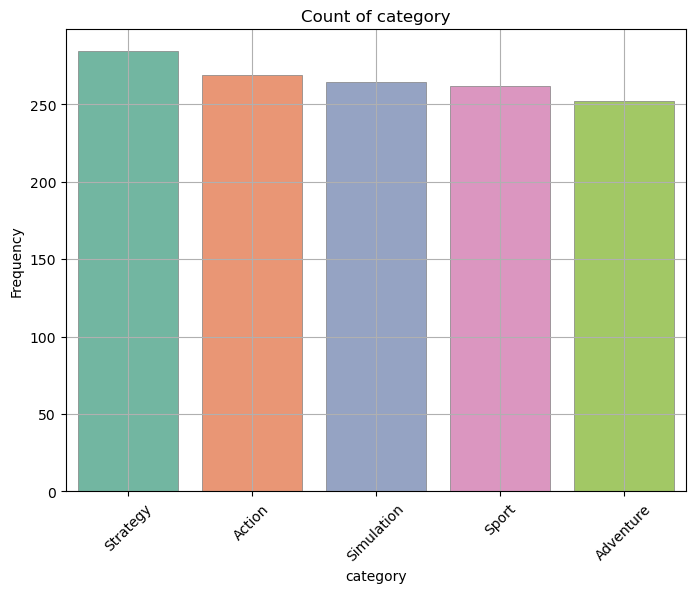

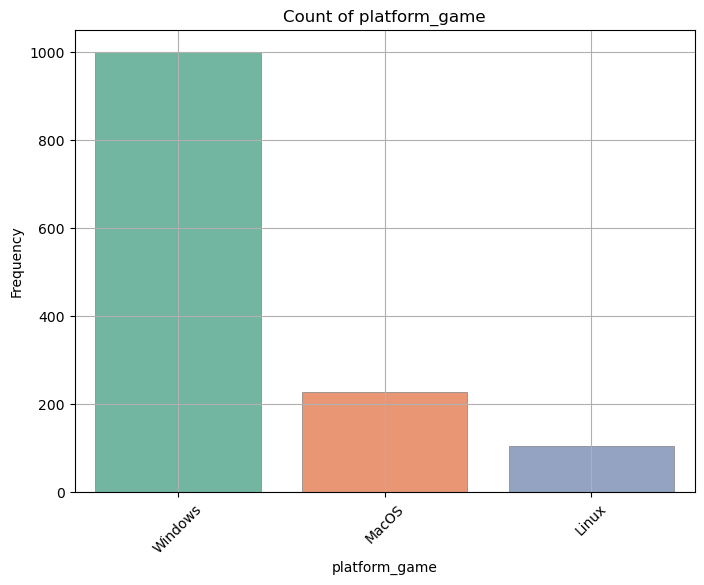

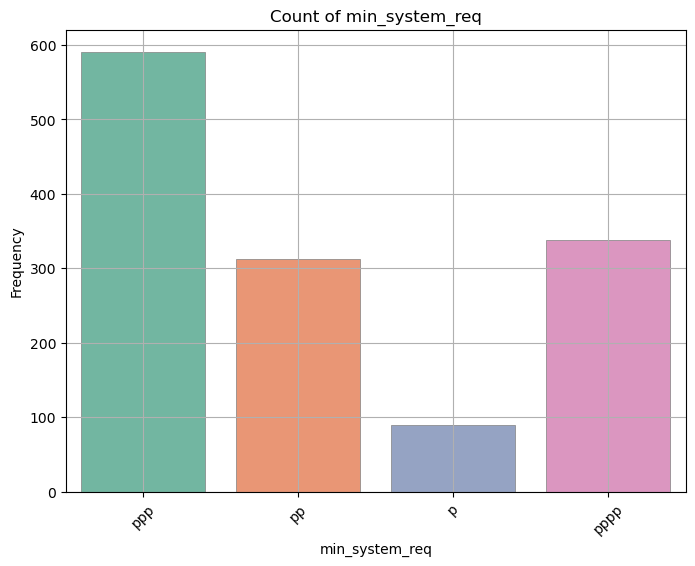

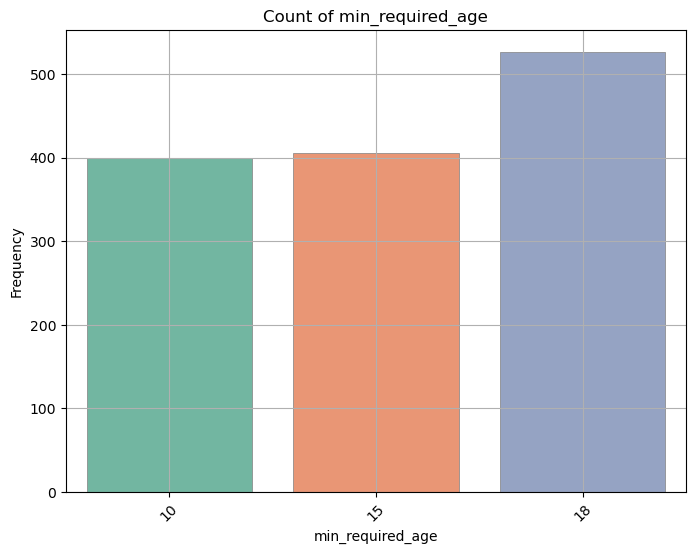

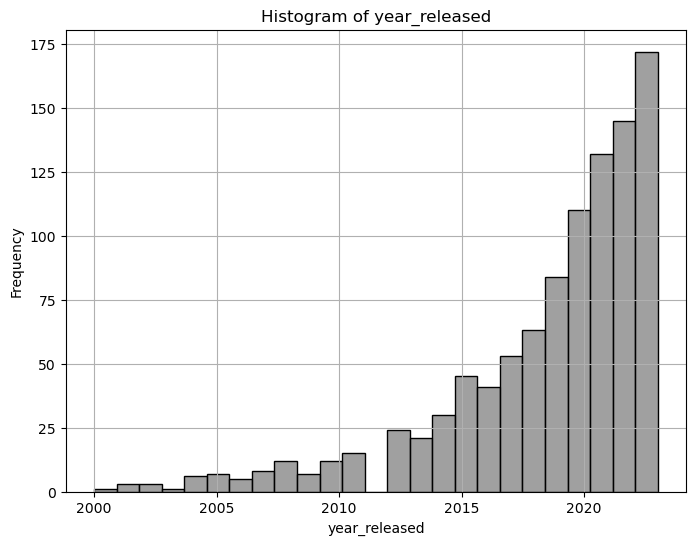

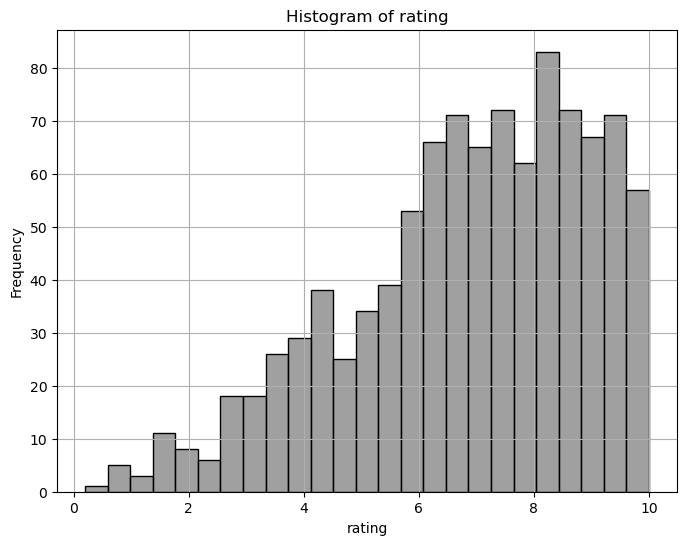

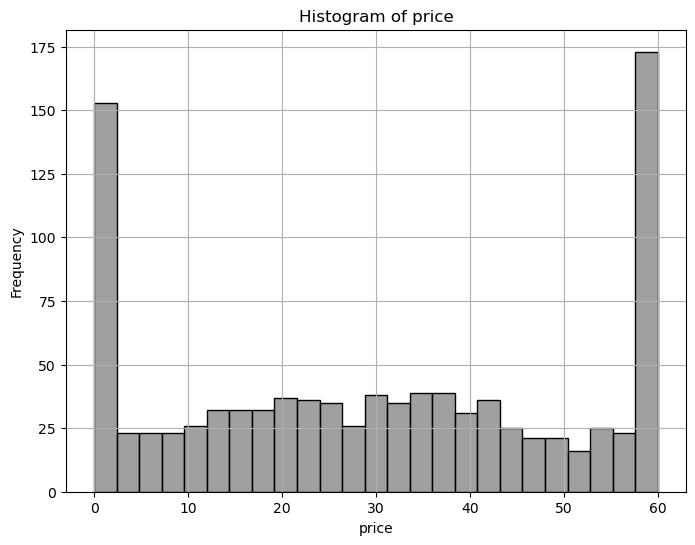

In [5]:
games_exploded = games_check.explode('platform_game')
categorical_columns = ['category', 'platform_game', 'min_system_req', 'min_required_age']
numeric_columns = ['year_released', 'rating', 'price']


for col in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, data=games_exploded, palette='Set2', linewidth=0.5, edgecolor='gray')  # Set palette to 'Greys'
    plt.title(f'Count of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)  
    plt.grid(True)
    plt.show()


for col in numeric_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(games_check[col], color='gray', bins=25) 
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()


### Now lets create the users data
### I created 4 segments, with my personal view of what type of games exist
### You can see below the assumptions i made so i will create the users based on those characteristics


SEGMENT 1: Poor Gamer
--------------------------------
* Age: Gaussian distro with a mean of 16
* price < 30
* min_system_req <= (p,pp)
* HAS_OFFER: 90% influence
* 90% consistent

SEGMENT 2: Epic Gamer - graphics lover
--------------------------------
* Age: Gaussian distro with a mean of 35
* rating >9 if minimum system requirements (ppp)
* rating >8 if minimum system requirements (pppp)
* platform must be Windows
* 95% yes if its Adventure 
* prefers the latest releases (beta distribution)
* 85% consistent

SEGMENT 3: Action - Shooting Gamer 
--------------------------------
* category : Action
* HAS_OFFER: 70% influence
* price as cheap as possible
* gender 95% Male

SEGMENT 4: Casual - Free time pass Gamer 
--------------------------------
* Age: Gaussian distro with a mean of 50, ok
* price = 0 
* min_system_req (p,pp)
* rating > 7
* category (strategy,Simulation)

In [6]:
users_segment1=generate_users_segment1(user_num=25000,seed = 42)
generate_ratings_segment1(users_segment1,games)

ones 0.038978637513102314


In [7]:
users_segment2=generate_users_segment2(user_num=25000,seed = 42)
generate_ratings_segment2(users_segment2,games)

ones 0.1157639841342621


In [8]:
users_segment3=generate_users_segment3(user_num=25000,seed = 42)
generate_ratings_segment3(users_segment3,games)

ones 0.025326602592434206


In [9]:
users_segment4=generate_users_segment4(user_num=25000,seed = 4)
generate_ratings_segment4(users_segment4,games)

ones 0.01951580646736035


In [10]:
file_paths = ['segment1.csv', 'segment2.csv','segment3.csv', 'segment4.csv']
dfs = [pd.read_csv(file_path) for file_path in file_paths]
combined_df = pd.concat(dfs, ignore_index=True)
df = combined_df.sample(frac=1).reset_index(drop=True)
print(df.shape)

(50032432, 16)


### After tries and testing of managing the dataset so i can cluster it, I understood that this wasnt possible.
### The Tabular data with each row represeting a pair of user - game rating couldnt work.
### So I decided to group by the data by user and do the clustering on the new generated dataset.
### ===================================================================================================================

### So i can make it clear for the categorical variables i created for each unique value 2 columns. 
### 1: counting the games votes like
### 2: counting the games votes dislike
### ===================================================================================================================
### For the numerical variables i created 4 columns
### 1: average for the games votes like
### 2: std for the games votes like
### 3: average for the games votes dislike
### 4: std for the games votes dislike

In [11]:
df

,uid,gender,age,country,platform_user,cluster,year_released,category,min_required_age,price,platform_game,has_offer,min_system_req,rating,result,gameid
0,7155c2,M,28,Mayotte,Windows,2,2009,Adventure,15,0.0,['Windows'],True,pppp,5.6,0,70
1,19341c1,F,15,Türkiye,Windows,1,2023,Action,15,4.1,"['Windows', 'MacOS']",True,p,0.2,-1,632
2,762c3,M,31,China,Windows,3,2023,Adventure,10,0.0,['Windows'],False,pppp,8.1,0,336
3,3796c4,F,48,Latvia,Windows,4,2003,Simulation,18,14.1,['Windows'],True,pp,9.5,0,487
4,6410c3,M,30,Maldives,Windows,3,2019,Sport,10,18.5,"['Windows', 'MacOS']",False,pp,7.0,0,779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50032427,13544c4,F,53,Samoa,Windows,4,2023,Simulation,10,60.0,['Windows'],False,ppp,9.1,0,808
50032428,19240c1,F,18,Malta,Linux,1,2007,Strategy,18,0.0,"['Windows', 'MacOS']",True,pppp,5.3,0,791
50032429,13222c1,F,11,"Taiwan, Province of China",MacOS,1,2021,Adventure,15,32.6,['Windows'],False,ppp,7.5,0,27
50032430,21676c4,M,52,Trinidad and Tobago,Linux,4,2018,Adventure,10,29.9,['Windows'],False,pppp,6.2,0,339


In [12]:
df_with_gameid = df.copy()
df = df.drop(columns=['gameid'])

In [83]:
result_df_enc,result_df_enc_norm,result_df = feature_engineering_result_1(df)# keeps only the data from the likes

### Here is just a plot for an overview of our data using PCA for dimentionality reduction

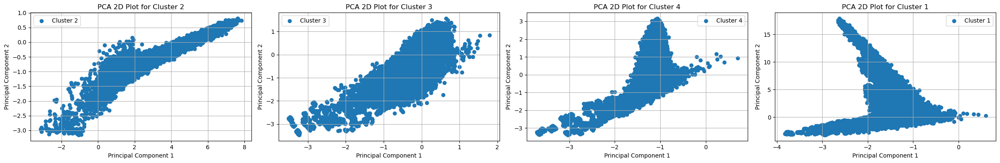

In [54]:
clusters = result_df_enc['cluster']
data = result_df_enc.drop(columns=['cluster'])

scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['cluster'] = clusters

unique_clusters = pca_df['cluster'].unique()
num_clusters = len(unique_clusters)
fig, axs = plt.subplots(1, num_clusters, figsize=(6*num_clusters, 4))

for i, cluster in enumerate(unique_clusters):
    cluster_data = pca_df[pca_df['cluster'] == cluster]
    axs[i].scatter(cluster_data['PC1'], cluster_data['PC2'], label=f'Cluster {cluster}')
    axs[i].set_xlabel('Principal Component 1')
    axs[i].set_ylabel('Principal Component 2')
    axs[i].set_title(f'PCA 2D Plot for Cluster {cluster}')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
plt.show()

### By staring the process with the new dataset I used all the data from both likes and dislikes
### But the results were not promising
### My result was the the data had too much noise with all the 0s not letting the algorythms to find any possible pattern, since the % of the like are pretty low
### I first understood that from the plot below which even when i had all the data the most important features were the columns with the likes
### You can see that on the below plot were the feature importance is calculated on the whole dataset

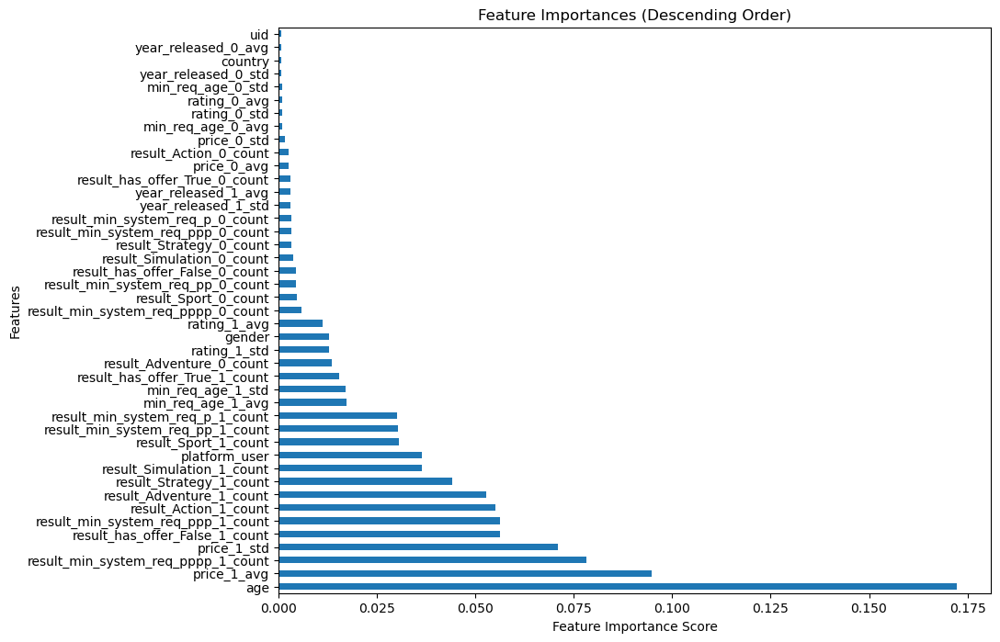

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesClassifier

result_df_enc_all,result_df_enc_norm_all,result_df_all = feature_engineering(df)#keeps all data

X = result_df_enc_norm_all 
y = result_df_enc_all['cluster'] 

model = ExtraTreesClassifier()

model.fit(X, y)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances = feat_importances.sort_values(ascending=False)

plt.figure(figsize=(10, 8))
feat_importances.plot(kind='barh')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title('Feature Importances (Descending Order)')
plt.show()

### After I filtered the dataset I used plenty of clustering algorythms (Kmeans, Algomerative, DBSCAN) and dimentionality reduction methods (PCA,UMAP) for ploting
### I decided that the best combination was the GMM for clustering and PCA for DR

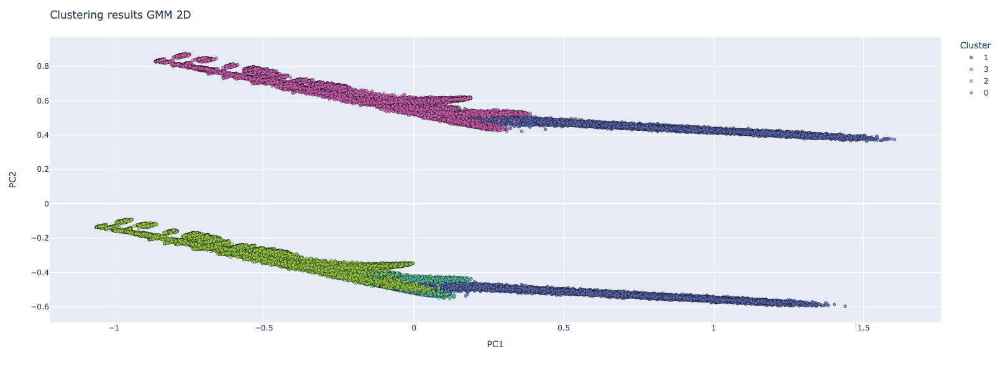

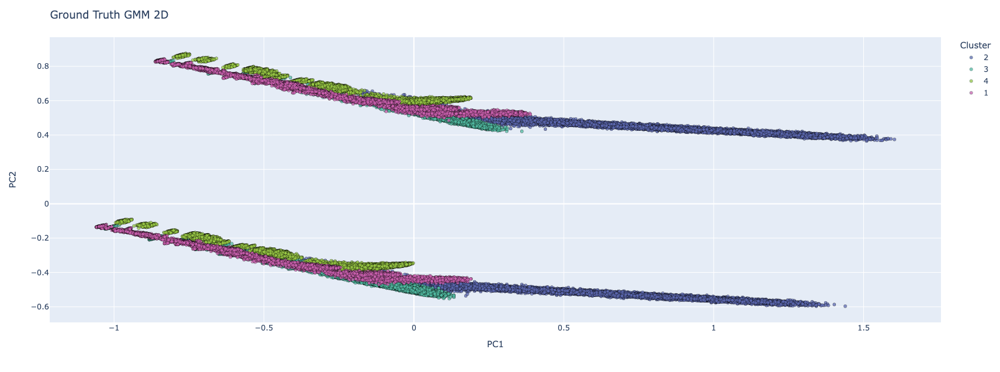

In [86]:
#Clustering results
gmm = GaussianMixture(n_components=4, random_state=42)
gmm.fit(result_df_enc_norm)

clusters = gmm.predict(result_df_enc_norm)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(result_df_enc_norm)

plot_gmm = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
plot_gmm['Cluster'] = clusters.astype(str)

fig = px.scatter(plot_gmm, x='PC1', y='PC2', color='Cluster',
                 color_discrete_sequence=px.colors.qualitative.Vivid[1:])
fig.update_traces(marker=dict(size=5, opacity=0.75, line=dict(width=0.5, color='DarkSlateGrey')))
fig.update_layout(title="Clustering results GMM 2D",
                  width=800, height=600,
                  legend_title='Cluster')
fig.show()

#Ground Truth
# gmm = GaussianMixture(n_components=4, random_state=42)
# gmm.fit(result_df_enc_norm)
clusters_gt = result_df_enc['cluster']

pca = PCA(n_components=2)
pca_result = pca.fit_transform(result_df_enc_norm)

plot_gmm = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
plot_gmm['Cluster_gt'] = clusters_gt.astype(str)

fig = px.scatter(plot_gmm, x='PC1', y='PC2', color='Cluster_gt',
                 color_discrete_sequence=px.colors.qualitative.Vivid[1:])
fig.update_traces(marker=dict(size=5, opacity=0.75, line=dict(width=0.5, color='DarkSlateGrey')))
fig.update_layout(title="Ground Truth GMM 2D",
                  width=800, height=600,
                  legend_title='Cluster')
fig.show()

### As we can see the 2 dimentions are not so helpfull so lets try the 3D plots

### The 3d plots are being removed, due to Github restriction of 25mb files. But the commented code below can create it.

In [1]:
# gmm = GaussianMixture(n_components=4, random_state=42)
# gmm.fit(result_df_enc_norm)

# clusters = gmm.predict(result_df_enc_norm)
# pca = PCA(n_components=3)
# pca_result = pca.fit_transform(result_df_enc_norm)

# plot_gmm = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3'])
# plot_gmm['Cluster'] = clusters.astype(str)

# # Plot clusters using PCA results
# fig = px.scatter_3d(plot_gmm, x='PC1', y='PC2', z='PC3', color='Cluster',
#                     color_discrete_sequence=px.colors.qualitative.Vivid[1:])
# fig.update_traces(marker=dict(size=2))
# fig.update_layout(title="Clustering results GMM 3D",
#                   width=800, height=600,
#                   legend_title='Cluster')
# fig.show()



# # gmm = GaussianMixture(n_components=4, random_state=42)
# # gmm.fit(result_df_enc_norm)

# clusters_gt = result_df_enc['cluster']

# pca = PCA(n_components=3)
# pca_result = pca.fit_transform(result_df_enc_norm)

# plot_gmm = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3'])
# plot_gmm['clusters_gt'] = clusters.astype(str)

# fig = px.scatter_3d(plot_gmm, x='PC1', y='PC2', z='PC3', color='clusters_gt',
#                     color_discrete_sequence=px.colors.qualitative.Vivid[1:])
# fig.update_traces(marker=dict(size=2))
# fig.update_layout(title="Ground Truth GMM 3D",
#                   width=800, height=600,
#                   legend_title='Cluster')
# fig.show()

### As we can see the cluster are much easier to been recognised in 3D

### Now lets create a confusion matrix so we can have the total overview

In [89]:
cluster_counts = result_df_enc.groupby('cluster').size().reset_index(name='count')
print("===================")
cluster_counts

,cluster,count
0,1,23664
1,2,24779
2,3,23204
3,4,22780


### Not all the 100,000 users are being in the clusters, because as we can see below there are 5313 users with only dislikes, that is normal not been able to get clustered

In [90]:
# Group by 'uid' and filter groups where all 'result' values are 0
uids_with_only_zero = df.groupby('uid').filter(lambda x: all(x['result'] == 0))['uid'].nunique()

print("Count of UIDs with only dislikes:", uids_with_only_zero)

uids_with_ones = df.groupby('uid').filter(lambda x: any(x['result'] == 1) or (any(x['result'] == 0) and any(x['result'] == 1)))['uid'].nunique()

print("Count of UIDs with likes and dislikes or only likes", uids_with_ones)

Count of UIDs with only dislikes: 5313
Count of UIDs with likes and dislikes or only likes 94427


Counts for list1_gen:
c1: 11796
c2: 152
c3: 3403
c4: 11325
Counts for list2_gen:
c1: 0
c2: 24512
c3: 0
c4: 0
Counts for list3_gen:
c1: 8086
c2: 115
c3: 5035
c4: 11455
Counts for list4_gen:
c1: 3782
c2: 0
c3: 14766
c4: 0


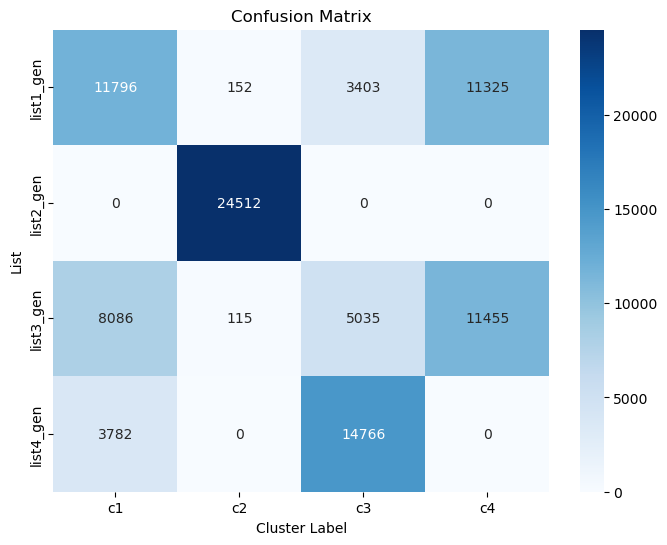

In [91]:
confusion_matrix(result_df,clusters)

### From the matrix we can see that there is cluster that is really easy to identify, 1 with a majority , and the rest 2 been difficult to identify (the smaller ones, that why the generated plots were actually pretty clear to identify

### Now I would like to implement something extra
### Lets say we create a FastAPI so that it can make some predictions, by given specific characteristics

In [66]:
df_with_gameid.head()

,uid,gender,age,country,platform_user,cluster,year_released,category,min_required_age,price,platform_game,has_offer,min_system_req,rating,result,gameid
0,7155c2,M,28,Mayotte,Windows,2,2009,Adventure,15,0.0,['Windows'],True,pppp,5.6,0,70
1,19341c1,F,15,Türkiye,Windows,1,2023,Action,15,4.1,"['Windows', 'MacOS']",True,p,0.2,-1,632
2,762c3,M,31,China,Windows,3,2023,Adventure,10,0.0,['Windows'],False,pppp,8.1,0,336
3,3796c4,F,48,Latvia,Windows,4,2003,Simulation,18,14.1,['Windows'],True,pp,9.5,0,487
4,6410c3,M,30,Maldives,Windows,3,2019,Sport,10,18.5,"['Windows', 'MacOS']",False,pp,7.0,0,779


In [27]:
df_2 = df_with_gameid.loc[:, ['gender', 'age', 'platform_user', 'gameid','result']]

In [28]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df_2['gender'] = encoder.fit_transform(df_2['gender'])
df_2['platform_user'] = encoder.fit_transform(df_2['platform_user'])

In [24]:
scaler = MinMaxScaler()
df_2 = pd.DataFrame(scaler.fit_transform(df_2), columns=df_2.columns)

In [43]:
X = df_2.drop('result', axis=1)
y = df_2['result']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

logreg_classifier = LogisticRegression(max_iter=100, random_state=42)

logreg_classifier.fit(X_train, y_train)

y_pred = logreg_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

KeyError: 'cluster'

In [45]:
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9502172940413554
Precision: 0.9029129058952755
Recall: 0.9502172940413554
F1 Score: 0.9259613363639148


### So now by giving the information about the user and the game id, the model can predict if the user will like or not the game

In [46]:
joblib.dump(logreg_classifier, 'log_reg_like_dislike.joblib')#save the model

['log_reg_like_dislike.joblib']

In [68]:
import requests

# Define the URL of your FastAPI endpoint
url = "http://0.0.0.0:8002/like_dislike/" # Assuming "web" is the service name in your docker-compose.yaml

# Define the user features as a dictionary
user_features = {
    "gender": 1,
    "age": 30,
    "platform_user": 2,
    "gameid": 70
}

# Send a POST request to the endpoint with the user features
response = requests.post(url, json=user_features)

# Check if the request was successful
if response.status_code == 200:
    # Print the response JSON data
    print(response.json())
else:
    # Print an error message if the request failed
    print("Error:", response.status_code, response.text)


{'cluster_generated': 0}
